# GAN Image Generator

### Wasserstein GAN with Gradient Penalty (WGAN-GP)

The goal is to develop a generative model that can produce images good enough to score under a certain threshold (1000) in MiFID. 

WGAN-GP [(Paper)](https://arxiv.org/abs/1704.00028) was chosen due to its advancements in stability, mitigation of mode collapse, and provide meaningful learning curves; all of which were setbacks in traditional GANs. This approach (WGAN) was initially developed by Arjovsky et al. [(Paper)](https://arxiv.org/abs/1701.07875). Gradient Penalty (the GP in WGAN-GP) addresses the weight-clipping in traditional WGANs, which caused capacity bottlenecks, vanishing/exploding gradients, and training instability. 

Below we'll inspect/preprocess the data, build and train the models, and generate images using the generator model.

In [1]:
import numpy as np

import tensorflow as tf
from tensorflow.keras import (
    layers,
    models,
    callbacks,
    utils,
    metrics,
    optimizers,
)

import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from IPython.display import display as ipy_display

2025-06-12 16:32:51.941384: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749745972.140651      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749745972.199822      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
# # Setting up TPU for training

# # detect and init the TPU
# tpu = tf.distribute.cluster_resolver.TPUClusterResolver()

# # instantiate a distribution strategy
# tf.tpu.experimental.initialize_tpu_system(tpu)
# tpu_strategy = tf.distribute.TPUStrategy(tpu)

In [3]:
os.listdir('/kaggle/input/gan-getting-started/')

['monet_jpg', 'photo_tfrec', 'photo_jpg', 'monet_tfrec']

## Dataset 

The Dataset contains 7028 images of size 256x256 and three channels (RGB). 

The images i'm using are in the photo_jpg/ directory.

Below we will randomly display 25 images

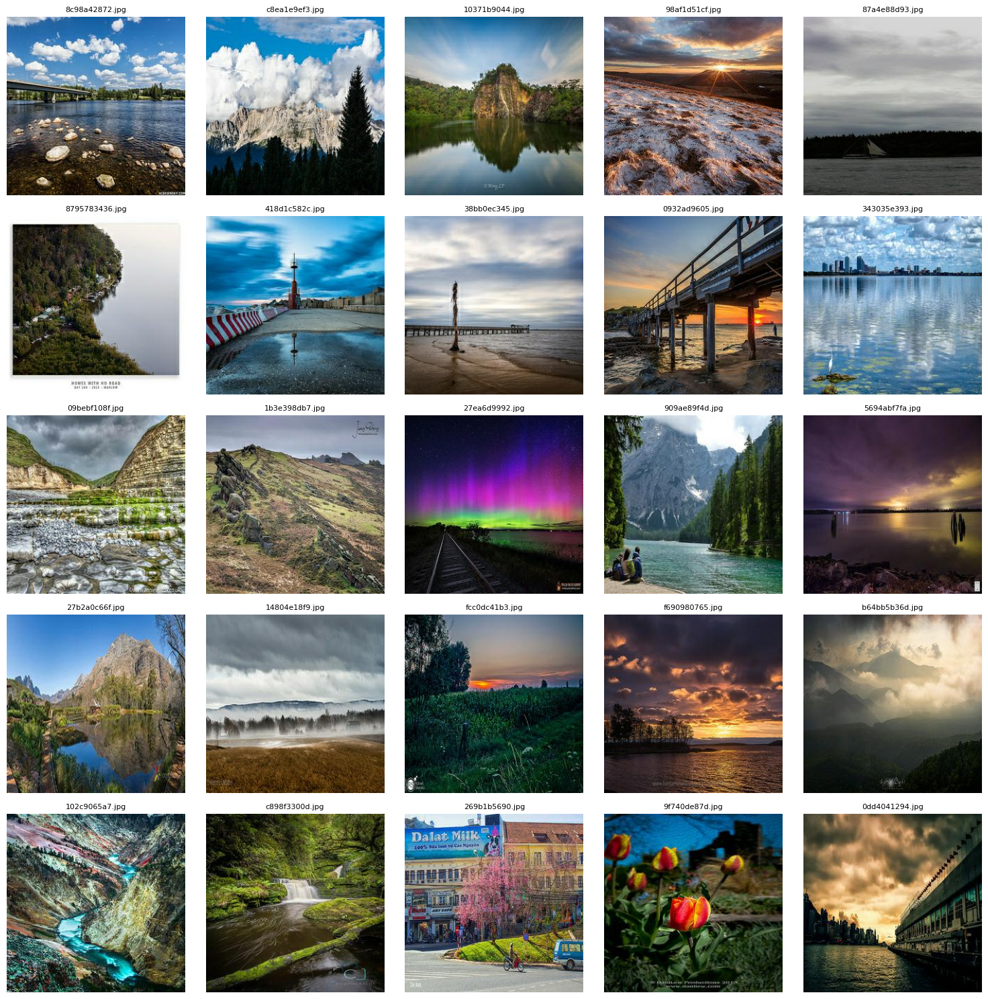

In [4]:
PHOTO_DIR = '/kaggle/input/gan-getting-started/photo_jpg'

n_samples = 25

# Get all JPEG files
jpeg_files = [f for f in os.listdir(PHOTO_DIR) if f.lower().endswith('.jpg') or f.lower().endswith('.jpeg')]

# Randomly select up to 25 files
selected_files = random.sample(jpeg_files, min(n_samples, len(jpeg_files)))

# Set up the plot
fig, axes = plt.subplots(5, 5, figsize=(15, 15))
axes = axes.flatten()

for ax, filename in zip(axes, selected_files):
    img = mpimg.imread(os.path.join(PHOTO_DIR, filename))
    ax.imshow(img)
    ax.set_title(filename, fontsize=8)
    ax.axis('off')

for ax in axes[len(selected_files):]:
    ax.axis('off')

plt.tight_layout()
plt.show()


In [5]:
# Parameters
IMAGE_SIZE = 256
CHANNEL_SIZE = 3
BATCH_SIZE = 64

# Load the data
train_data = utils.image_dataset_from_directory(
    PHOTO_DIR,
    labels=None,
    color_mode="rgb",
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    interpolation="bilinear",
)

Found 7038 files.


I0000 00:00:1749746025.873974      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


In [6]:
# Preprocess and augment the data
def preprocess(img):
    """
    Applies a random horizontal flip and then normalizes the images.
    """
    # Applying a random horizontal flip with 50% probability
    if tf.random.uniform(()) > 0.5:
        img = tf.image.flip_left_right(img)

    # Normalize and reshape the images
    img = (tf.cast(img, "float32") - 127.5) / 127.5
    return img

train = train_data.map(lambda x: preprocess(x))

# Pre-load the next batch of images while the GPU is busy
train = train.prefetch(buffer_size=tf.data.AUTOTUNE)

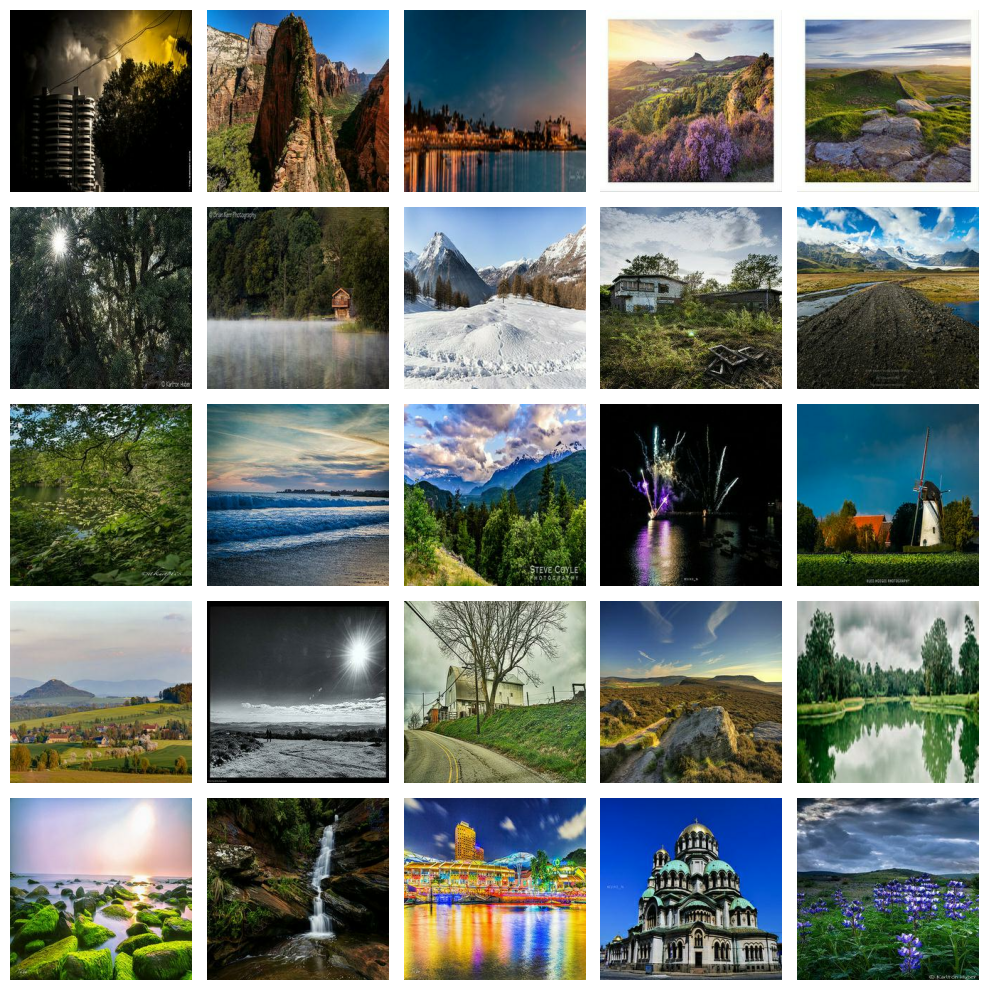

In [7]:
# Get a batch of images from the dataset
for imgs in train.take(1):
    images = imgs.numpy()

images = (images * 127.5 + 127.5).astype('uint8')

# Plot 5x5 grid
n = min(25, images.shape[0])
plt.figure(figsize=(10, 10))
for i in range(n):
    plt.subplot(5, 5, i + 1)
    plt.imshow(images[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

## Build the WGAN-GP
WGAN-GP introduces the Wasserstein Loss function and the gradient penalty. These advancements help steer the GAN so that training is stable and gradients are strong enough to generate high-quality images. 

Wasserstein loss is used by the critic (Discriminator) to maximize the difference between it's predictions and the generated images. The Generator utilizes wasserstein loss to produce outputs that elicits a high score from the critic. Due to this scoring system, sigmoid activation is not used as the final layer of the critic; the score can range from - infiniti to infiniti. The original WGAN paper used weight-clipping to constrain (Lipschitz Constraint) the loss. 

The critic needs to be a 1-Lipschitz continuous function, essentially limiting the rate the predictions of the critic can change, with the absolute value of the gradient being at most 1 everywhere. WGAN-GP uses Gradient Penalty for this. It keeps the critic from deviating outside of the 1-lipschitz continuum by penalizing the squared deviation of the gradient norm from 1.

### Build the Critic
Build out the critic (Discriminator)
- Take the input image and pass it through a series of convolutional layers with leaky ReLU activation.
    - We're starting with 64 filters, 4x4 kernel size, and stride 2. It should provide enough capacity to capture low-level features
    - Downsampling to 512 filters before reaching the final layers
- The final layer uses a stride of 1 and padding of valid. this will output (1,1,1) per image, which is what you want for a scalar critic output.

In [8]:
critic_input = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNEL_SIZE))

x = layers.Conv2D(64, kernel_size=4, strides=2, padding="same")(critic_input)
x = layers.LeakyReLU(0.2)(x)

x = layers.Conv2D(128, kernel_size=4, strides=2, padding="same")(x)
x = layers.LeakyReLU(0.2)(x)

x = layers.Conv2D(256, kernel_size=4, strides=2, padding="same")(x)
x = layers.LeakyReLU(0.2)(x)

x = layers.Conv2D(512, kernel_size=4, strides=2, padding="same")(x)
x = layers.LeakyReLU(0.2)(x)

# x = layers.Conv2D(1024, kernel_size=4, strides=2, padding="same")(x)
# x = layers.LeakyReLU(0.2)(x)

# x = layers.Conv2D(2048, kernel_size=4, strides=2, padding="same")(x)
# x = layers.LeakyReLU(0.2)(x)

x = layers.Conv2D(1, kernel_size=4, strides=2, padding="same")(x)
x = layers.Conv2D(1, kernel_size=8, strides=1, padding="valid")(x)

# x = layers.Conv2D(1, kernel_size=4, strides=1, padding="valid")(x)
critic_output = layers.Flatten()(x)

critic = models.Model(critic_input, critic_output)
critic.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 128, 128, 64)        │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 64, 64, 128)         │         131,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 32, 32, 256)         │         524,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 16, 16, 512)         │       2,097,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 16, 16, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 8, 8, 1)             │           8,193 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 1, 1, 1)             │              65 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 1)                   │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,764,802 (10.55 MB)

 Trainable params: 2,764,802 (10.55 MB)

 Non-trainable params: 0 (0.00 B)

### Build the Generator
Build out the Generator
- Take the input image and pass it through a series of Convolutional Transpose layers with Batch normalization and leaky ReLU activation.
    - We start with a Dense layer to create enough nodes and reshape it to form our fist block
    - We then upsample through six layers of Convolution Transpose layers until we get back to the original image size (256x256x3) followed by Batch Normalization and ReLU activation
    - The final layer uses a tahn activations to scale the output pixels between -1 and 1

In [10]:
Z_DIM = 128

generator_input = layers.Input(shape=(Z_DIM,))
# We use a Dense layer to create enough nodes (4 * 4 * 1024) to form our first block.
# Then we'll reshape it to a starting block of 4x4
x = layers.Dense(4 * 4 * 1024, use_bias=False)(generator_input)
x = layers.Reshape((4, 4, 1024))(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)

# 4x4x1024 -> 8x8x512
x = layers.Conv2DTranspose(512, kernel_size=4, strides=2, padding="same", use_bias=False)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)

# 8x8x512 -> 16x16x256
x = layers.Conv2DTranspose(256, kernel_size=4, strides=2, padding="same", use_bias=False)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)

# 16x16x256 -> 32x32x128
x = layers.Conv2DTranspose(128, kernel_size=4, strides=2, padding="same", use_bias=False)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)

# 32x32x128 -> 64x64x64
x = layers.Conv2DTranspose(64, kernel_size=4, strides=2, padding="same", use_bias=False)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)

# 64x64x64 -> 128x128x64 (keeping the filter size the same here)
x = layers.Conv2DTranspose(64, kernel_size=4, strides=2, padding="same", use_bias=False)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)

# Block 7 (Final Layer): 128x128x64 -> 256x256x3
# The final layer uses a 'tanh' activation to scale the output pixels to [-1, 1].
generator_output = layers.Conv2DTranspose(
    CHANNEL_SIZE, kernel_size=4, strides=2, padding="same", activation="tanh"
)(x)
generator = models.Model(generator_input, generator_output)
generator.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 16384)               │       2,097,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_1 (Reshape)                  │ (None, 4, 4, 1024)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 4, 4, 1024)          │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_10 (LeakyReLU)           │ (None, 4, 4, 1024)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_6 (Conv2DTranspose) │ (None, 8, 8, 512)           │       8,388,608 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 8, 8, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_11 (LeakyReLU)           │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_7 (Conv2DTranspose) │ (None, 16, 16, 256)         │       2,097,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_12 (LeakyReLU)           │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_8 (Conv2DTranspose) │ (None, 32, 32, 128)         │         524,288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_13 (LeakyReLU)           │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_9 (Conv2DTranspose) │ (None, 64, 64, 64)          │         131,072 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_14 (LeakyReLU)           │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_10                  │ (None, 128, 128, 64)        │          65,536 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 13,315,075 (50.79 MB)

 Trainable params: 13,310,979 (50.78 MB)

 Non-trainable params: 4,096 (16.00 KB)

### Build the WGAN-GP Architecture
- Initialization
    - Critic and Generator networks are provided when initialized
    - latent_dim: Random noise vector size
    - critic_steps: the amount of times the critic gets trained per generator update
    - gp_weight: scaling coefficient for the gradient penalty term
- Compile
    - Attaches optimizers and metric trackers to model
- Metrics:
    - c_gp: Critic Gradient penalty; the penalty for the critic's gradient deviating from the norm of 1
    - g_loss: Generator loss
    - c_wass_loss: Critic Wasserstein Loss; the closer to zero, the harder it is for the critic to discern between real and fake images
    - c_loss: Critic Loss (c_wass_loss + c_gp * gp_weight)
- Gradient Penalty
    - Computes the gradient penalty averaged over a batch
- Training Steps
    - One trainng step:
        - Runs the critic update 'critis_steps' times
        - Followed by one Generator update
        - Updates metrics


In [11]:
class WGANGP(models.Model):
    def __init__(self, critic, generator, latent_dim, critic_steps, gp_weight):
        super(WGANGP, self).__init__()
        self.critic = critic
        self.generator = generator
        self.latent_dim = latent_dim
        self.critic_steps = critic_steps
        self.gp_weight = gp_weight

    def compile(self, c_optimizer, g_optimizer):
        super(WGANGP, self).compile()

        # Optimizers
        self.c_optimizer = c_optimizer
        self.g_optimizer = g_optimizer

        # Metric objects
        self.c_wass_loss_metric = metrics.Mean(name="c_wass_loss")
        self.c_gp_metric = metrics.Mean(name="c_gp")
        self.c_loss_metric = metrics.Mean(name="c_loss")
        self.g_loss_metric = metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [
            self.c_loss_metric,
            self.c_wass_loss_metric,
            self.c_gp_metric,
            self.g_loss_metric,
        ]

    def gradient_penalty(self, batch_size, real_images, fake_images):
        # Coefficients
        alpha = tf.random.uniform([batch_size, 1, 1, 1], 0.0, 1.0)

        # Interpolate between real and fake
        diff = fake_images - real_images
        interpolated = real_images + alpha * diff
        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            pred = self.critic(interpolated, training=True)

        # Gradients, L2 norms and penalty
        grads = gp_tape.gradient(pred, interpolated)
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        gp = tf.reduce_mean((norm - 1.0) ** 2)
        return gp

    def train_step(self, real_images):
        batch_size = tf.shape(real_images)[0]

        # --- Critic Training Loop ---
        for i in range(self.critic_steps):
            random_latent_vectors = tf.random.normal(
                shape=(batch_size, self.latent_dim)
            )
            with tf.GradientTape() as tape:
                # Generate fake images and get critic predictions
                fake_images = self.generator(random_latent_vectors, training=True)
                fake_predictions = self.critic(fake_images, training=True)
                real_predictions = self.critic(real_images, training=True)

                # Calculate losses
                c_wass_loss = tf.reduce_mean(fake_predictions) - tf.reduce_mean(real_predictions)
                c_gp = self.gradient_penalty(batch_size, real_images, fake_images)
                c_loss = c_wass_loss + c_gp * self.gp_weight

            # Calculate and apply gradients for this step
            c_gradient = tape.gradient(c_loss, self.critic.trainable_variables)
            self.c_optimizer.apply_gradients(
                zip(c_gradient, self.critic.trainable_variables)
            )

        # --- Generator Training ---
        random_latent_vectors = tf.random.normal(
            shape=(batch_size, self.latent_dim)
        )
        with tf.GradientTape() as tape:
            fake_images = self.generator(random_latent_vectors, training=True)
            fake_predictions = self.critic(fake_images, training=True)
            g_loss = -tf.reduce_mean(fake_predictions)

        gen_gradient = tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(
            zip(gen_gradient, self.generator.trainable_variables)
        )

        # Update metrics
        self.c_loss_metric.update_state(c_loss)
        self.c_wass_loss_metric.update_state(c_wass_loss)
        self.c_gp_metric.update_state(c_gp)
        self.g_loss_metric.update_state(g_loss)

        return {m.name: m.result() for m in self.metrics}

### Initialize and Build Model


In [12]:
# Model Hyperparameters
CRITIC_STEPS = 2
GP_WEIGHT = 10

# Optimizer Hyperparameters
ADAM_BETA_1 = 0.0
ADAM_BETA_2 = 0.9
LEARNING_RATE = 5e-4

# with tpu_strategy.scope():
# Create a GAN
wgangp = WGANGP(
    critic=critic,
    generator=generator,
    latent_dim=Z_DIM,
    critic_steps=CRITIC_STEPS,
    gp_weight=GP_WEIGHT,
)

# Compile the GAN
wgangp.compile(
    c_optimizer=optimizers.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
    g_optimizer=optimizers.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
)

In [13]:
# Create a model save checkpoint
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath="./checkpoint/checkpoint.weights.h5",
    save_weights_only=True,
    save_freq="epoch",
    verbose=0,
)

tensorboard_callback = callbacks.TensorBoard(log_dir="./logs")


class ImageGenerator(callbacks.Callback):
    def __init__(self, latent_dim):
        self.latent_dim = latent_dim
        self.generated_images = []

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vector = tf.random.normal(shape=(1, self.latent_dim))
        generated_image = self.model.generator(random_latent_vector)
        generated_image = generated_image * 127.5 + 127.5
        generated_image = generated_image.numpy().astype("uint8")[0]
        self.generated_images.append(generated_image)

        # Display every 10th image
        if (epoch + 1) % 10 == 0:
            plt.figure(figsize=(2, 2))
            plt.imshow(generated_image)
            plt.axis('off')
            plt.title(f"Epoch {epoch + 1}")
            plt.show()

In [14]:
wgangp.build(input_shape=(None, 256, 256, 3))

Epoch 1/500


I0000 00:00:1749746125.781588     104 service.cc:148] XLA service 0x7ace00002330 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1749746125.782398     104 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1749746127.335978     104 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1749746143.973738     104 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


10/10 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step - c_gp: 0.4176 - c_loss: -12.1942 - c_wass_loss: -16.3699 - g_loss: -6.3985  
Epoch 2/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1092 - c_loss: -22.5125 - c_wass_loss: -23.6046 - g_loss: -4.6300  
Epoch 3/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1109 - c_loss: -17.5679 - c_wass_loss: -18.6771 - g_loss: -3.8176  
Epoch 4/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1163 - c_loss: -12.9915 - c_wass_loss: -14.1544 - g_loss: -19.5907  
Epoch 5/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0253 - c_loss: -13.6495 - c_wass_loss: -13.9024 - g_loss: 0.4684  
Epoch 6/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1034 - c_loss: -17.9177 - c_wass_loss: -18.9518 - g_loss: -10.4945  
Epoch 7/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1237 - c_loss: -21.2877 - c_wass_loss: -22.5244 - g_loss: 17.6341  
Epoch 8/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2071 - c_loss: -23.4872 - c_wass_loss: -25.5581

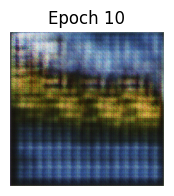

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2252 - c_loss: -31.0895 - c_wass_loss: -33.3412 - g_loss: -2.4116  
Epoch 11/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 27s 3s/step - c_gp: 0.3490 - c_loss: -29.8165 - c_wass_loss: -33.3069 - g_loss: -21.0810
Epoch 12/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3929 - c_loss: -33.0514 - c_wass_loss: -36.9805 - g_loss: -66.1375  
Epoch 13/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3421 - c_loss: -30.1636 - c_wass_loss: -33.5846 - g_loss: -47.5519  
Epoch 14/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3024 - c_loss: -29.4840 - c_wass_loss: -32.5080 - g_loss: -83.4803  
Epoch 15/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2817 - c_loss: -28.5808 - c_wass_loss: -31.3978 - g_loss: -62.7198  
Epoch 16/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2123 - c_loss: -24.3442 - c_wass_loss: -26.4667 - g_loss: -76.2440  
Epoch 17/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2197 - c_loss: -25.1166 - c_wass_loss

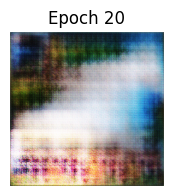

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3106 - c_loss: -30.8506 - c_wass_loss: -33.9569 - g_loss: -123.0631  
Epoch 21/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2623 - c_loss: -28.6013 - c_wass_loss: -31.2240 - g_loss: -122.0447  
Epoch 22/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3118 - c_loss: -29.0197 - c_wass_loss: -32.1377 - g_loss: -137.4924  
Epoch 23/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2172 - c_loss: -25.8143 - c_wass_loss: -27.9866 - g_loss: -132.4961  
Epoch 24/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2806 - c_loss: -33.0221 - c_wass_loss: -35.8278 - g_loss: -126.7652  
Epoch 25/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.4331 - c_loss: -31.7103 - c_wass_loss: -36.0415 - g_loss: -174.8084  
Epoch 26/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.4257 - c_loss: -32.8287 - c_wass_loss: -37.0853 - g_loss: -156.8656  
Epoch 27/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3654 - c_loss: -30.2267 - c

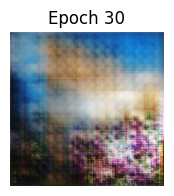

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.4141 - c_loss: -31.5388 - c_wass_loss: -35.6794 - g_loss: -145.7654  
Epoch 31/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3553 - c_loss: -33.1818 - c_wass_loss: -36.7352 - g_loss: -167.1982  
Epoch 32/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3044 - c_loss: -28.7456 - c_wass_loss: -31.7895 - g_loss: -166.3459  
Epoch 33/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3478 - c_loss: -29.9406 - c_wass_loss: -33.4181 - g_loss: -125.0706  
Epoch 34/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2787 - c_loss: -31.1398 - c_wass_loss: -33.9265 - g_loss: -162.1764  
Epoch 35/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2370 - c_loss: -27.3858 - c_wass_loss: -29.7557 - g_loss: -183.9242  
Epoch 36/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.4269 - c_loss: -34.9050 - c_wass_loss: -39.1736 - g_loss: -128.2815  
Epoch 37/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.4428 - c_loss: -34.2052 - c

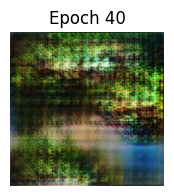

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.4381 - c_loss: -34.7575 - c_wass_loss: -39.1383 - g_loss: -147.7831  
Epoch 41/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.6899 - c_loss: -40.7128 - c_wass_loss: -47.6116 - g_loss: -206.5240  
Epoch 42/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3095 - c_loss: -29.2966 - c_wass_loss: -32.3921 - g_loss: -117.3408  
Epoch 43/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.4523 - c_loss: -32.4422 - c_wass_loss: -36.9654 - g_loss: -146.9000  
Epoch 44/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2195 - c_loss: -30.2744 - c_wass_loss: -32.4694 - g_loss: -168.9056  
Epoch 45/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3305 - c_loss: -29.1654 - c_wass_loss: -32.4707 - g_loss: -120.6177  
Epoch 46/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3671 - c_loss: -30.7158 - c_wass_loss: -34.3866 - g_loss: -121.7436  
Epoch 47/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.4048 - c_loss: -31.8416 - c

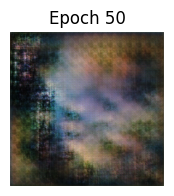

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3967 - c_loss: -31.2538 - c_wass_loss: -35.2209 - g_loss: -165.8309  
Epoch 51/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.4824 - c_loss: -31.5292 - c_wass_loss: -36.3528 - g_loss: -130.1291  
Epoch 52/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3614 - c_loss: -31.1183 - c_wass_loss: -34.7327 - g_loss: -99.0730  
Epoch 53/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3198 - c_loss: -27.5699 - c_wass_loss: -30.7674 - g_loss: -120.8792  
Epoch 54/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.4043 - c_loss: -28.1236 - c_wass_loss: -32.1671 - g_loss: -194.1791  
Epoch 55/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3245 - c_loss: -29.5047 - c_wass_loss: -32.7495 - g_loss: -121.3719  
Epoch 56/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2646 - c_loss: -28.8431 - c_wass_loss: -31.4896 - g_loss: -180.6681  
Epoch 57/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.5012 - c_loss: -32.7759 - c_

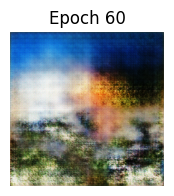

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2215 - c_loss: -27.4275 - c_wass_loss: -29.6427 - g_loss: -133.2251  
Epoch 61/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3899 - c_loss: -31.7062 - c_wass_loss: -35.6050 - g_loss: -148.7446  
Epoch 62/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3393 - c_loss: -29.6876 - c_wass_loss: -33.0805 - g_loss: -165.8332  
Epoch 63/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2676 - c_loss: -27.4266 - c_wass_loss: -30.1030 - g_loss: -86.7248  
Epoch 64/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3558 - c_loss: -28.6772 - c_wass_loss: -32.2356 - g_loss: -163.0439  
Epoch 65/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3397 - c_loss: -27.3446 - c_wass_loss: -30.7419 - g_loss: -140.6389  
Epoch 66/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3445 - c_loss: -28.4536 - c_wass_loss: -31.8988 - g_loss: -130.0930  
Epoch 67/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2503 - c_loss: -24.9152 - c_

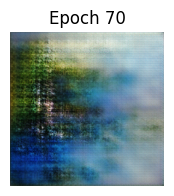

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3291 - c_loss: -29.2328 - c_wass_loss: -32.5240 - g_loss: -155.2212  
Epoch 71/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.4653 - c_loss: -33.9371 - c_wass_loss: -38.5898 - g_loss: -85.8056  
Epoch 72/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3530 - c_loss: -31.9939 - c_wass_loss: -35.5243 - g_loss: -91.0351  
Epoch 73/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3213 - c_loss: -30.9995 - c_wass_loss: -34.2121 - g_loss: -143.5600  
Epoch 74/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2729 - c_loss: -25.3299 - c_wass_loss: -28.0586 - g_loss: -148.2555  
Epoch 75/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3531 - c_loss: -28.0786 - c_wass_loss: -31.6093 - g_loss: -148.5877  
Epoch 76/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2155 - c_loss: -25.8167 - c_wass_loss: -27.9715 - g_loss: -94.0961  
Epoch 77/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2102 - c_loss: -24.5670 - c_wa

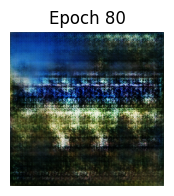

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3255 - c_loss: -27.9231 - c_wass_loss: -31.1786 - g_loss: -142.5719  
Epoch 81/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2642 - c_loss: -26.2715 - c_wass_loss: -28.9134 - g_loss: -29.5986  
Epoch 82/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.5549 - c_loss: -31.3851 - c_wass_loss: -36.9345 - g_loss: -216.0137  
Epoch 83/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2695 - c_loss: -25.4591 - c_wass_loss: -28.1544 - g_loss: -176.8137  
Epoch 84/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3519 - c_loss: -25.3463 - c_wass_loss: -28.8657 - g_loss: -177.0609  
Epoch 85/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2980 - c_loss: -26.8912 - c_wass_loss: -29.8708 - g_loss: -118.4537  
Epoch 86/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2994 - c_loss: -26.2131 - c_wass_loss: -29.2072 - g_loss: -124.5902  
Epoch 87/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3267 - c_loss: -25.4259 - c_

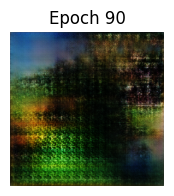

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2927 - c_loss: -25.1019 - c_wass_loss: -28.0287 - g_loss: -122.6999  
Epoch 91/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2770 - c_loss: -26.4582 - c_wass_loss: -29.2285 - g_loss: -129.3185  
Epoch 92/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2451 - c_loss: -25.1345 - c_wass_loss: -27.5860 - g_loss: -121.7624  
Epoch 93/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2571 - c_loss: -27.2696 - c_wass_loss: -29.8410 - g_loss: -147.4227  
Epoch 94/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.4017 - c_loss: -31.1209 - c_wass_loss: -35.1376 - g_loss: -107.8507  
Epoch 95/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3472 - c_loss: -29.3822 - c_wass_loss: -32.8544 - g_loss: -192.9350  
Epoch 96/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2352 - c_loss: -23.3756 - c_wass_loss: -25.7279 - g_loss: -189.7929  
Epoch 97/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2806 - c_loss: -27.4090 - c

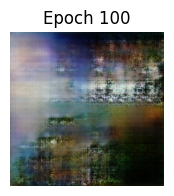

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2779 - c_loss: -27.0973 - c_wass_loss: -29.8759 - g_loss: -107.5180  
Epoch 101/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3405 - c_loss: -28.0184 - c_wass_loss: -31.4236 - g_loss: -79.1634  
Epoch 102/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3600 - c_loss: -25.9784 - c_wass_loss: -29.5783 - g_loss: -130.6019  
Epoch 103/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2312 - c_loss: -24.7962 - c_wass_loss: -27.1081 - g_loss: -105.6884  
Epoch 104/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3056 - c_loss: -23.0643 - c_wass_loss: -26.1200 - g_loss: -95.1974  
Epoch 105/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3145 - c_loss: -26.7564 - c_wass_loss: -29.9018 - g_loss: -121.5401  
Epoch 106/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3079 - c_loss: -25.1806 - c_wass_loss: -28.2599 - g_loss: -115.7301  
Epoch 107/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2542 - c_loss: -25.382

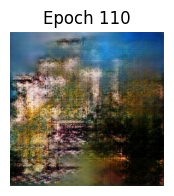

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3419 - c_loss: -25.8803 - c_wass_loss: -29.2996 - g_loss: -137.8398  
Epoch 111/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2979 - c_loss: -25.7997 - c_wass_loss: -28.7782 - g_loss: -124.0183  
Epoch 112/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.4095 - c_loss: -25.0946 - c_wass_loss: -29.1893 - g_loss: -116.8134  
Epoch 113/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.4028 - c_loss: -24.9985 - c_wass_loss: -29.0267 - g_loss: -113.7456  
Epoch 114/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3241 - c_loss: -24.5680 - c_wass_loss: -27.8094 - g_loss: -105.6658  
Epoch 115/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2950 - c_loss: -26.2792 - c_wass_loss: -29.2297 - g_loss: -155.6220  
Epoch 116/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2442 - c_loss: -23.2577 - c_wass_loss: -25.6995 - g_loss: -133.0587  
Epoch 117/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.4125 - c_loss: -29.6

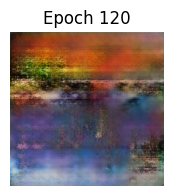

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3176 - c_loss: -25.7893 - c_wass_loss: -28.9648 - g_loss: -134.7786  
Epoch 121/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - c_gp: 0.2955 - c_loss: -23.9214 - c_wass_loss: -26.8761 - g_loss: -110.9461  
Epoch 122/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2523 - c_loss: -24.2206 - c_wass_loss: -26.7435 - g_loss: -107.1520  
Epoch 123/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3340 - c_loss: -26.0207 - c_wass_loss: -29.3612 - g_loss: -83.4953  
Epoch 124/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2620 - c_loss: -25.8894 - c_wass_loss: -28.5096 - g_loss: -94.9177  
Epoch 125/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2485 - c_loss: -22.2255 - c_wass_loss: -24.7109 - g_loss: -112.3024  
Epoch 126/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2014 - c_loss: -22.4200 - c_wass_loss: -24.4338 - g_loss: -117.4591  
Epoch 127/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2215 - c_loss: -24.423

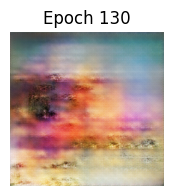

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3683 - c_loss: -26.4429 - c_wass_loss: -30.1259 - g_loss: -121.3141  
Epoch 131/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2394 - c_loss: -24.1197 - c_wass_loss: -26.5134 - g_loss: -95.1272  
Epoch 132/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3989 - c_loss: -26.3254 - c_wass_loss: -30.3142 - g_loss: -78.7016  
Epoch 133/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2668 - c_loss: -25.7536 - c_wass_loss: -28.4214 - g_loss: -118.2788  
Epoch 134/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2654 - c_loss: -23.2152 - c_wass_loss: -25.8692 - g_loss: -91.9257  
Epoch 135/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2265 - c_loss: -23.9575 - c_wass_loss: -26.2222 - g_loss: -104.3780  
Epoch 136/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2129 - c_loss: -22.9704 - c_wass_loss: -25.0993 - g_loss: -86.3333  
Epoch 137/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2223 - c_loss: -24.3451 

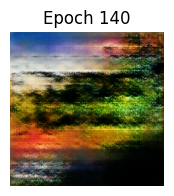

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2562 - c_loss: -26.3636 - c_wass_loss: -28.9257 - g_loss: -101.3673  
Epoch 141/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2678 - c_loss: -25.1116 - c_wass_loss: -27.7894 - g_loss: -118.2915  
Epoch 142/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2949 - c_loss: -25.4883 - c_wass_loss: -28.4373 - g_loss: -101.1144  
Epoch 143/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2347 - c_loss: -23.8815 - c_wass_loss: -26.2282 - g_loss: -64.3658  
Epoch 144/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3231 - c_loss: -27.5708 - c_wass_loss: -30.8018 - g_loss: -105.8316  
Epoch 145/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2492 - c_loss: -22.7716 - c_wass_loss: -25.2634 - g_loss: -57.8518  
Epoch 146/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2235 - c_loss: -22.2333 - c_wass_loss: -24.4679 - g_loss: -101.2543  
Epoch 147/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2533 - c_loss: -23.849

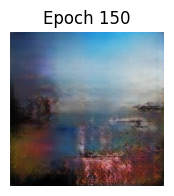

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3517 - c_loss: -24.9964 - c_wass_loss: -28.5130 - g_loss: -97.9294  
Epoch 151/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2965 - c_loss: -23.8273 - c_wass_loss: -26.7927 - g_loss: -96.1572  
Epoch 152/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2184 - c_loss: -22.9412 - c_wass_loss: -25.1248 - g_loss: -64.7123  
Epoch 153/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3813 - c_loss: -25.9988 - c_wass_loss: -29.8114 - g_loss: -66.6524  
Epoch 154/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2918 - c_loss: -21.7803 - c_wass_loss: -24.6983 - g_loss: -55.4142  
Epoch 155/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2665 - c_loss: -26.2899 - c_wass_loss: -28.9545 - g_loss: -68.4322  
Epoch 156/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3072 - c_loss: -25.6933 - c_wass_loss: -28.7652 - g_loss: -50.1491  
Epoch 157/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3826 - c_loss: -22.3157 - c

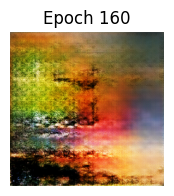

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2396 - c_loss: -25.3017 - c_wass_loss: -27.6975 - g_loss: -96.3319  
Epoch 161/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2673 - c_loss: -23.0048 - c_wass_loss: -25.6774 - g_loss: -58.6078  
Epoch 162/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2077 - c_loss: -21.1982 - c_wass_loss: -23.2752 - g_loss: -49.8771  
Epoch 163/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2684 - c_loss: -20.8485 - c_wass_loss: -23.5322 - g_loss: -75.8781  
Epoch 164/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2206 - c_loss: -23.8602 - c_wass_loss: -26.0660 - g_loss: -86.5146  
Epoch 165/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2601 - c_loss: -20.5986 - c_wass_loss: -23.1994 - g_loss: -19.9826  
Epoch 166/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2247 - c_loss: -23.0714 - c_wass_loss: -25.3185 - g_loss: -70.6413  
Epoch 167/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - c_gp: 0.3082 - c_loss: -23.9602 - c

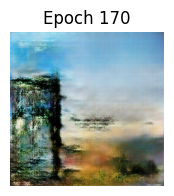

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2187 - c_loss: -24.2641 - c_wass_loss: -26.4512 - g_loss: -108.7373  
Epoch 171/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2213 - c_loss: -21.5357 - c_wass_loss: -23.7489 - g_loss: -40.6538  
Epoch 172/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.3001 - c_loss: -24.5546 - c_wass_loss: -27.5555 - g_loss: -158.9074  
Epoch 173/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1696 - c_loss: -21.8607 - c_wass_loss: -23.5567 - g_loss: -49.9560  
Epoch 174/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2485 - c_loss: -22.6747 - c_wass_loss: -25.1600 - g_loss: -36.4190  
Epoch 175/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1963 - c_loss: -22.6057 - c_wass_loss: -24.5687 - g_loss: -93.6216  
Epoch 176/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2152 - c_loss: -21.3750 - c_wass_loss: -23.5270 - g_loss: -70.8143  
Epoch 177/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2018 - c_loss: -21.9782 -

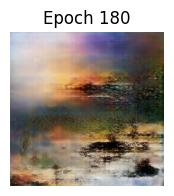

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1910 - c_loss: -22.2936 - c_wass_loss: -24.2040 - g_loss: -31.1476  
Epoch 181/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2672 - c_loss: -22.7255 - c_wass_loss: -25.3971 - g_loss: -65.4335  
Epoch 182/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2200 - c_loss: -28.4066 - c_wass_loss: -30.6066 - g_loss: -43.2422  
Epoch 183/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1870 - c_loss: -16.7723 - c_wass_loss: -18.6420 - g_loss: -69.1249  
Epoch 184/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2991 - c_loss: -22.1119 - c_wass_loss: -25.1033 - g_loss: -93.9851  
Epoch 185/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1739 - c_loss: -19.7081 - c_wass_loss: -21.4469 - g_loss: -93.7793  
Epoch 186/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2084 - c_loss: -22.6804 - c_wass_loss: -24.7648 - g_loss: -76.8096  
Epoch 187/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1806 - c_loss: -22.3199 - c

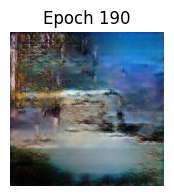

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1882 - c_loss: -20.9969 - c_wass_loss: -22.8788 - g_loss: -62.0558  
Epoch 191/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1876 - c_loss: -22.2279 - c_wass_loss: -24.1040 - g_loss: -52.4710  
Epoch 192/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2500 - c_loss: -22.0463 - c_wass_loss: -24.5458 - g_loss: -19.4900  
Epoch 193/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2234 - c_loss: -23.1727 - c_wass_loss: -25.4062 - g_loss: -61.7168  
Epoch 194/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1431 - c_loss: -16.6822 - c_wass_loss: -18.1132 - g_loss: -32.6299  
Epoch 195/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1354 - c_loss: -20.4621 - c_wass_loss: -21.8162 - g_loss: -34.8803  
Epoch 196/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1711 - c_loss: -21.0529 - c_wass_loss: -22.7642 - g_loss: -47.1310  
Epoch 197/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1595 - c_loss: -17.8480 - c

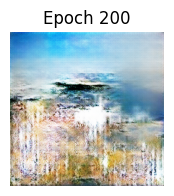

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1930 - c_loss: -21.5797 - c_wass_loss: -23.5093 - g_loss: -68.1482  
Epoch 201/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2261 - c_loss: -21.4420 - c_wass_loss: -23.7026 - g_loss: -81.2068  
Epoch 202/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1261 - c_loss: -17.8774 - c_wass_loss: -19.1386 - g_loss: -73.2893  
Epoch 203/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1903 - c_loss: -21.5149 - c_wass_loss: -23.4180 - g_loss: -72.5469  
Epoch 204/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2298 - c_loss: -22.1502 - c_wass_loss: -24.4482 - g_loss: -60.3639  
Epoch 205/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2468 - c_loss: -20.6995 - c_wass_loss: -23.1672 - g_loss: -71.9907  
Epoch 206/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2497 - c_loss: -21.7810 - c_wass_loss: -24.2778 - g_loss: -68.0881  
Epoch 207/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2364 - c_loss: -20.8074 - c

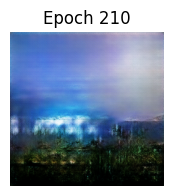

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1729 - c_loss: -20.4677 - c_wass_loss: -22.1968 - g_loss: -76.0577  
Epoch 211/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2187 - c_loss: -20.5806 - c_wass_loss: -22.7673 - g_loss: -58.3157  
Epoch 212/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1470 - c_loss: -20.1587 - c_wass_loss: -21.6291 - g_loss: -43.7146  
Epoch 213/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1721 - c_loss: -19.5239 - c_wass_loss: -21.2445 - g_loss: -58.6831  
Epoch 214/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2349 - c_loss: -23.0959 - c_wass_loss: -25.4450 - g_loss: -81.0329  
Epoch 215/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1692 - c_loss: -19.6145 - c_wass_loss: -21.3068 - g_loss: -85.9770  
Epoch 216/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1979 - c_loss: -22.0802 - c_wass_loss: -24.0595 - g_loss: -58.9502  
Epoch 217/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1872 - c_loss: -22.2040 - c

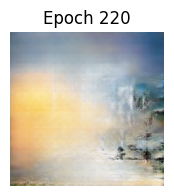

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1300 - c_loss: -18.7157 - c_wass_loss: -20.0160 - g_loss: -75.2857  
Epoch 221/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2195 - c_loss: -22.3971 - c_wass_loss: -24.5916 - g_loss: 50.2233  
Epoch 222/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1475 - c_loss: -17.7383 - c_wass_loss: -19.2129 - g_loss: -106.8023  
Epoch 223/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1996 - c_loss: -21.6458 - c_wass_loss: -23.6422 - g_loss: -91.2862  
Epoch 224/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1686 - c_loss: -16.6103 - c_wass_loss: -18.2963 - g_loss: 10.0779  
Epoch 225/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1370 - c_loss: -20.7160 - c_wass_loss: -22.0862 - g_loss: -72.3977  
Epoch 226/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1439 - c_loss: -16.9822 - c_wass_loss: -18.4210 - g_loss: -72.7700  
Epoch 227/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2061 - c_loss: -21.0394 - c_

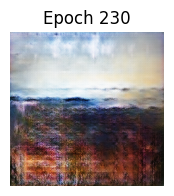

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1611 - c_loss: -18.8083 - c_wass_loss: -20.4196 - g_loss: -74.5151  
Epoch 231/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1662 - c_loss: -19.8065 - c_wass_loss: -21.4684 - g_loss: -49.4512  
Epoch 232/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1712 - c_loss: -20.9731 - c_wass_loss: -22.6850 - g_loss: -45.0261  
Epoch 233/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1920 - c_loss: -20.6876 - c_wass_loss: -22.6076 - g_loss: -50.0317  
Epoch 234/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2107 - c_loss: -22.2120 - c_wass_loss: -24.3193 - g_loss: -42.8904  
Epoch 235/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1779 - c_loss: -18.8777 - c_wass_loss: -20.6568 - g_loss: -52.6147  
Epoch 236/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1660 - c_loss: -20.1930 - c_wass_loss: -21.8530 - g_loss: -14.0158 
Epoch 237/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1461 - c_loss: -19.2131 - c_

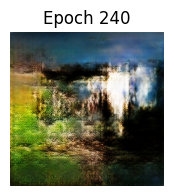

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1526 - c_loss: -19.5666 - c_wass_loss: -21.0922 - g_loss: -65.4935  
Epoch 241/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1483 - c_loss: -19.9149 - c_wass_loss: -21.3980 - g_loss: -45.6772  
Epoch 242/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1822 - c_loss: -20.6244 - c_wass_loss: -22.4467 - g_loss: -67.3774  
Epoch 243/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1249 - c_loss: -19.5714 - c_wass_loss: -20.8205 - g_loss: -54.2369  
Epoch 244/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2017 - c_loss: -21.7548 - c_wass_loss: -23.7718 - g_loss: -75.1559  
Epoch 245/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2082 - c_loss: -20.7159 - c_wass_loss: -22.7983 - g_loss: -84.4504  
Epoch 246/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1769 - c_loss: -19.7604 - c_wass_loss: -21.5294 - g_loss: -95.3915  
Epoch 247/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1713 - c_loss: -20.7417 - c

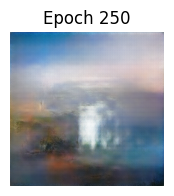

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1656 - c_loss: -18.4814 - c_wass_loss: -20.1377 - g_loss: -38.8627  
Epoch 251/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1691 - c_loss: -20.1241 - c_wass_loss: -21.8149 - g_loss: -56.0368  
Epoch 252/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1694 - c_loss: -19.9114 - c_wass_loss: -21.6059 - g_loss: -68.4354  
Epoch 253/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1799 - c_loss: -20.8828 - c_wass_loss: -22.6814 - g_loss: -38.6724  
Epoch 254/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1132 - c_loss: -17.9701 - c_wass_loss: -19.1021 - g_loss: -63.5019  
Epoch 255/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1450 - c_loss: -20.1781 - c_wass_loss: -21.6281 - g_loss: -66.2152  
Epoch 256/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1603 - c_loss: -19.6534 - c_wass_loss: -21.2559 - g_loss: -75.2699  
Epoch 257/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1832 - c_loss: -19.9850 - c

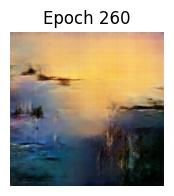

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1203 - c_loss: -16.8061 - c_wass_loss: -18.0091 - g_loss: -91.9118  
Epoch 261/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1583 - c_loss: -18.5383 - c_wass_loss: -20.1213 - g_loss: -49.9511  
Epoch 262/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1955 - c_loss: -21.1086 - c_wass_loss: -23.0639 - g_loss: -71.1700  
Epoch 263/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1584 - c_loss: -18.6589 - c_wass_loss: -20.2426 - g_loss: -14.7986  
Epoch 264/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1393 - c_loss: -18.0848 - c_wass_loss: -19.4775 - g_loss: -67.4839  
Epoch 265/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1363 - c_loss: -15.3779 - c_wass_loss: -16.7414 - g_loss: -22.2516  
Epoch 266/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1424 - c_loss: -18.0314 - c_wass_loss: -19.4551 - g_loss: -60.4546  
Epoch 267/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1446 - c_loss: -17.0134 - c

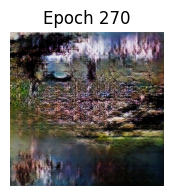

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1583 - c_loss: -20.4476 - c_wass_loss: -22.0305 - g_loss: -62.3354  
Epoch 271/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0979 - c_loss: -14.8833 - c_wass_loss: -15.8620 - g_loss: -50.6597  
Epoch 272/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1324 - c_loss: -16.8356 - c_wass_loss: -18.1601 - g_loss: -46.4644  
Epoch 273/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1806 - c_loss: -21.3193 - c_wass_loss: -23.1249 - g_loss: -76.0869  
Epoch 274/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1985 - c_loss: -20.3844 - c_wass_loss: -22.3692 - g_loss: -70.1388  
Epoch 275/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1535 - c_loss: -20.2857 - c_wass_loss: -21.8205 - g_loss: -21.5442  
Epoch 276/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1369 - c_loss: -18.3255 - c_wass_loss: -19.6947 - g_loss: -99.5547   
Epoch 277/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1339 - c_loss: -19.6270 - 

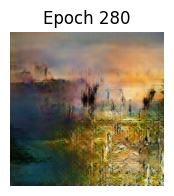

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1541 - c_loss: -19.3626 - c_wass_loss: -20.9034 - g_loss: -44.0058  
Epoch 281/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1414 - c_loss: -16.8875 - c_wass_loss: -18.3010 - g_loss: -38.7801  
Epoch 282/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1625 - c_loss: -20.3608 - c_wass_loss: -21.9855 - g_loss: -86.3349  
Epoch 283/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1252 - c_loss: -19.1709 - c_wass_loss: -20.4234 - g_loss: -53.5231  
Epoch 284/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1938 - c_loss: -18.1893 - c_wass_loss: -20.1272 - g_loss: -41.1705  
Epoch 285/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1765 - c_loss: -18.8563 - c_wass_loss: -20.6213 - g_loss: -43.3375  
Epoch 286/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2528 - c_loss: -20.0502 - c_wass_loss: -22.5778 - g_loss: -75.9246  
Epoch 287/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1602 - c_loss: -18.3775 - c

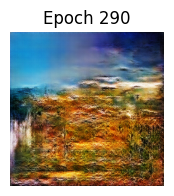

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2038 - c_loss: -19.6459 - c_wass_loss: -21.6841 - g_loss: -45.4232  
Epoch 291/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1699 - c_loss: -19.1685 - c_wass_loss: -20.8679 - g_loss: -48.0011  
Epoch 292/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1184 - c_loss: -17.2240 - c_wass_loss: -18.4077 - g_loss: -46.9080  
Epoch 293/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2118 - c_loss: -21.8539 - c_wass_loss: -23.9715 - g_loss: -54.5147  
Epoch 294/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1282 - c_loss: -17.4732 - c_wass_loss: -18.7556 - g_loss: -49.8560  
Epoch 295/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1473 - c_loss: -19.5944 - c_wass_loss: -21.0675 - g_loss: -81.3560  
Epoch 296/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1825 - c_loss: -19.3410 - c_wass_loss: -21.1664 - g_loss: -35.8033  
Epoch 297/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1523 - c_loss: -17.4894 - c

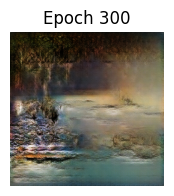

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1422 - c_loss: -18.0808 - c_wass_loss: -19.5032 - g_loss: -44.7289  
Epoch 301/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - c_gp: 0.2646 - c_loss: -23.7209 - c_wass_loss: -26.3665 - g_loss: -52.9261  
Epoch 302/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1710 - c_loss: -16.3819 - c_wass_loss: -18.0917 - g_loss: -33.7651  
Epoch 303/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1354 - c_loss: -16.1756 - c_wass_loss: -17.5297 - g_loss: -26.6124  
Epoch 304/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0876 - c_loss: -12.7821 - c_wass_loss: -13.6577 - g_loss: -27.1389  
Epoch 305/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0720 - c_loss: -14.7455 - c_wass_loss: -15.4655 - g_loss: -70.2626  
Epoch 306/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0988 - c_loss: -18.9171 - c_wass_loss: -19.9051 - g_loss: -22.9871  
Epoch 307/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1181 - c_loss: -16.5599 - c

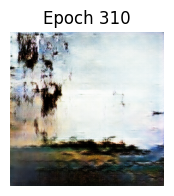

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1566 - c_loss: -16.0886 - c_wass_loss: -17.6543 - g_loss: -38.7745  
Epoch 311/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1306 - c_loss: -16.6861 - c_wass_loss: -17.9916 - g_loss: -45.3614  
Epoch 312/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1287 - c_loss: -19.0501 - c_wass_loss: -20.3375 - g_loss: -22.5785  
Epoch 313/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1357 - c_loss: -20.3973 - c_wass_loss: -21.7540 - g_loss: 11.6816  
Epoch 314/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1185 - c_loss: -18.5898 - c_wass_loss: -19.7744 - g_loss: -35.4256  
Epoch 315/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1305 - c_loss: -17.0432 - c_wass_loss: -18.3482 - g_loss: -57.1648  
Epoch 316/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1292 - c_loss: -15.6713 - c_wass_loss: -16.9634 - g_loss: -34.9599  
Epoch 317/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1532 - c_loss: -17.7986 - c_

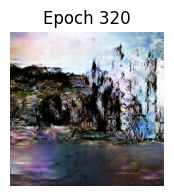

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1310 - c_loss: -18.6004 - c_wass_loss: -19.9103 - g_loss: 29.9228  
Epoch 321/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1631 - c_loss: -18.9487 - c_wass_loss: -20.5797 - g_loss: -67.2809  
Epoch 322/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1283 - c_loss: -17.1930 - c_wass_loss: -18.4762 - g_loss: -59.6382  
Epoch 323/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1119 - c_loss: -16.2723 - c_wass_loss: -17.3915 - g_loss: -53.8169  
Epoch 324/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1157 - c_loss: -16.2206 - c_wass_loss: -17.3774 - g_loss: -35.3777  
Epoch 325/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1831 - c_loss: -17.8430 - c_wass_loss: -19.6737 - g_loss: -29.9499  
Epoch 326/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2452 - c_loss: -21.4018 - c_wass_loss: -23.8538 - g_loss: -23.5243  
Epoch 327/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1301 - c_loss: -15.1917 - c_

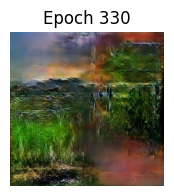

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1257 - c_loss: -19.2839 - c_wass_loss: -20.5409 - g_loss: -13.9166  
Epoch 331/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0986 - c_loss: -17.5016 - c_wass_loss: -18.4880 - g_loss: -66.8430  
Epoch 332/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1207 - c_loss: -17.1929 - c_wass_loss: -18.4003 - g_loss: -65.2014  
Epoch 333/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1864 - c_loss: -20.5687 - c_wass_loss: -22.4329 - g_loss: -38.5909  
Epoch 334/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - c_gp: 0.1351 - c_loss: -17.8311 - c_wass_loss: -19.1825 - g_loss: -46.2307  
Epoch 335/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0883 - c_loss: -14.8545 - c_wass_loss: -15.7379 - g_loss: 21.8728  
Epoch 336/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0981 - c_loss: -16.9048 - c_wass_loss: -17.8855 - g_loss: -54.2883  
Epoch 337/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1534 - c_loss: -19.2402 - c_

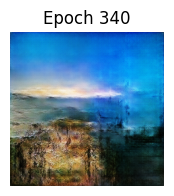

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1972 - c_loss: -19.6737 - c_wass_loss: -21.6452 - g_loss: -24.8555  
Epoch 341/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1339 - c_loss: -17.9164 - c_wass_loss: -19.2554 - g_loss: -26.7460  
Epoch 342/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2056 - c_loss: -19.1701 - c_wass_loss: -21.2265 - g_loss: -47.9551  
Epoch 343/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1264 - c_loss: -17.8063 - c_wass_loss: -19.0704 - g_loss: -54.7329  
Epoch 344/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1634 - c_loss: -18.0657 - c_wass_loss: -19.6992 - g_loss: -54.0128  
Epoch 345/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1043 - c_loss: -16.1325 - c_wass_loss: -17.1758 - g_loss: -1.7625 
Epoch 346/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1348 - c_loss: -18.3873 - c_wass_loss: -19.7350 - g_loss: -75.8699  
Epoch 347/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1276 - c_loss: -18.7394 - c_w

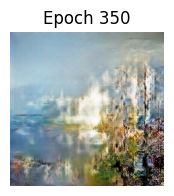

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1422 - c_loss: -17.8720 - c_wass_loss: -19.2942 - g_loss: -50.2523  
Epoch 351/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1530 - c_loss: -16.6508 - c_wass_loss: -18.1805 - g_loss: -64.5880  
Epoch 352/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1218 - c_loss: -16.8885 - c_wass_loss: -18.1062 - g_loss: -37.8289  
Epoch 353/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1187 - c_loss: -18.4209 - c_wass_loss: -19.6084 - g_loss: -49.4822  
Epoch 354/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1523 - c_loss: -15.0772 - c_wass_loss: -16.6000 - g_loss: -26.7760  
Epoch 355/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1382 - c_loss: -16.3137 - c_wass_loss: -17.6962 - g_loss: -69.4879  
Epoch 356/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1243 - c_loss: -17.0289 - c_wass_loss: -18.2722 - g_loss: -64.3732  
Epoch 357/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1607 - c_loss: -17.6516 - c

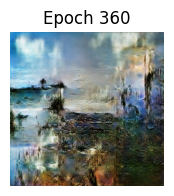

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1584 - c_loss: -18.4679 - c_wass_loss: -20.0518 - g_loss: -58.0190  
Epoch 361/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1171 - c_loss: -17.6389 - c_wass_loss: -18.8100 - g_loss: -24.5847  
Epoch 362/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1074 - c_loss: -15.9277 - c_wass_loss: -17.0016 - g_loss: -59.3604  
Epoch 363/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1234 - c_loss: -17.9478 - c_wass_loss: -19.1819 - g_loss: -41.6057  
Epoch 364/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1400 - c_loss: -17.4304 - c_wass_loss: -18.8304 - g_loss: -45.0311  
Epoch 365/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1229 - c_loss: -17.3715 - c_wass_loss: -18.6003 - g_loss: -63.8853  
Epoch 366/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1482 - c_loss: -18.4082 - c_wass_loss: -19.8900 - g_loss: -52.3238  
Epoch 367/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0997 - c_loss: -16.0882 - c

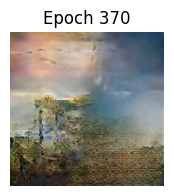

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1312 - c_loss: -16.9931 - c_wass_loss: -18.3049 - g_loss: -42.8790  
Epoch 371/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1047 - c_loss: -16.9002 - c_wass_loss: -17.9468 - g_loss: -38.3375  
Epoch 372/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1492 - c_loss: -18.2989 - c_wass_loss: -19.7908 - g_loss: -26.9728  
Epoch 373/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1625 - c_loss: -17.2921 - c_wass_loss: -18.9170 - g_loss: -44.8576  
Epoch 374/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2513 - c_loss: -19.0370 - c_wass_loss: -21.5499 - g_loss: 19.7983  
Epoch 375/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1702 - c_loss: -19.5259 - c_wass_loss: -21.2283 - g_loss: -56.3675  
Epoch 376/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1028 - c_loss: -16.4317 - c_wass_loss: -17.4601 - g_loss: -35.3679  
Epoch 377/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1485 - c_loss: -18.0637 - c_

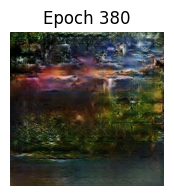

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0917 - c_loss: -16.5604 - c_wass_loss: -17.4769 - g_loss: 21.5668  
Epoch 381/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1468 - c_loss: -17.7824 - c_wass_loss: -19.2500 - g_loss: -47.9197  
Epoch 382/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1778 - c_loss: -19.2075 - c_wass_loss: -20.9860 - g_loss: -70.7408  
Epoch 383/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1356 - c_loss: -16.6027 - c_wass_loss: -17.9586 - g_loss: -30.0249  
Epoch 384/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1391 - c_loss: -17.4358 - c_wass_loss: -18.8266 - g_loss: -69.3114  
Epoch 385/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1293 - c_loss: -17.5259 - c_wass_loss: -18.8192 - g_loss: -16.9308  
Epoch 386/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0998 - c_loss: -15.6138 - c_wass_loss: -16.6121 - g_loss: -46.4081  
Epoch 387/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1103 - c_loss: -17.4033 - c_

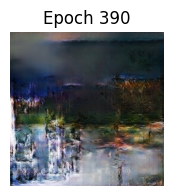

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1407 - c_loss: -16.9666 - c_wass_loss: -18.3732 - g_loss: -38.5600  
Epoch 391/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1183 - c_loss: -17.7812 - c_wass_loss: -18.9642 - g_loss: -40.8748  
Epoch 392/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1297 - c_loss: -17.6175 - c_wass_loss: -18.9145 - g_loss: -56.1995  
Epoch 393/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1554 - c_loss: -17.5692 - c_wass_loss: -19.1233 - g_loss: -53.7729  
Epoch 394/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1081 - c_loss: -18.8506 - c_wass_loss: -19.9320 - g_loss: -58.5836  
Epoch 395/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1376 - c_loss: -17.3711 - c_wass_loss: -18.7467 - g_loss: -49.8990  
Epoch 396/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1279 - c_loss: -17.4910 - c_wass_loss: -18.7701 - g_loss: -55.4723  
Epoch 397/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1602 - c_loss: -16.8944 - c

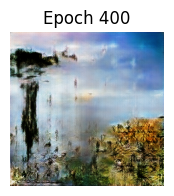

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0851 - c_loss: -16.4817 - c_wass_loss: -17.3327 - g_loss: -57.5357  
Epoch 401/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1515 - c_loss: -17.7946 - c_wass_loss: -19.3093 - g_loss: -43.0897  
Epoch 402/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0749 - c_loss: -15.0825 - c_wass_loss: -15.8319 - g_loss: -38.0144  
Epoch 403/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1073 - c_loss: -16.4932 - c_wass_loss: -17.5662 - g_loss: -55.8298  
Epoch 404/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1244 - c_loss: -18.5543 - c_wass_loss: -19.7981 - g_loss: -45.1954  
Epoch 405/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1232 - c_loss: -16.6106 - c_wass_loss: -17.8427 - g_loss: -66.2343  
Epoch 406/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0905 - c_loss: -16.1294 - c_wass_loss: -17.0347 - g_loss: -23.9840  
Epoch 407/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1135 - c_loss: -17.2411 - c

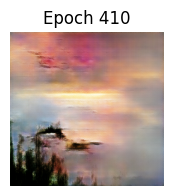

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1502 - c_loss: -17.9815 - c_wass_loss: -19.4831 - g_loss: -64.3724  
Epoch 411/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2135 - c_loss: -20.2511 - c_wass_loss: -22.3859 - g_loss: -38.9550  
Epoch 412/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1448 - c_loss: -17.1740 - c_wass_loss: -18.6224 - g_loss: -46.6029  
Epoch 413/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0702 - c_loss: -14.5398 - c_wass_loss: -15.2423 - g_loss: -79.5554  
Epoch 414/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1103 - c_loss: -15.6756 - c_wass_loss: -16.7783 - g_loss: 23.2929  
Epoch 415/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1284 - c_loss: -18.2535 - c_wass_loss: -19.5380 - g_loss: -20.5953  
Epoch 416/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0884 - c_loss: -15.6126 - c_wass_loss: -16.4961 - g_loss: -55.3415  
Epoch 417/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0866 - c_loss: -15.9330 - c_

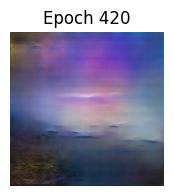

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1938 - c_loss: -18.7443 - c_wass_loss: -20.6821 - g_loss: -61.6122  
Epoch 421/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1098 - c_loss: -16.4851 - c_wass_loss: -17.5832 - g_loss: -79.9380  
Epoch 422/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0951 - c_loss: -16.2566 - c_wass_loss: -17.2079 - g_loss: -31.6732  
Epoch 423/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1283 - c_loss: -17.5385 - c_wass_loss: -18.8213 - g_loss: -31.8228  
Epoch 424/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1384 - c_loss: -16.7248 - c_wass_loss: -18.1088 - g_loss: -29.4109  
Epoch 425/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1003 - c_loss: -15.3367 - c_wass_loss: -16.3395 - g_loss: -52.4717  
Epoch 426/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0776 - c_loss: -14.7196 - c_wass_loss: -15.4960 - g_loss: -33.6649  
Epoch 427/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0948 - c_loss: -16.8322 - c

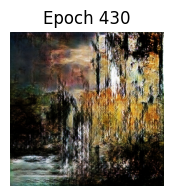

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1025 - c_loss: -17.3636 - c_wass_loss: -18.3883 - g_loss: -31.7231  
Epoch 431/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1857 - c_loss: -19.0995 - c_wass_loss: -20.9566 - g_loss: -62.1716  
Epoch 432/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.2046 - c_loss: -21.9688 - c_wass_loss: -24.0145 - g_loss: -60.5352  
Epoch 433/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1254 - c_loss: -16.5414 - c_wass_loss: -17.7957 - g_loss: -82.1960  
Epoch 434/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1407 - c_loss: -17.5550 - c_wass_loss: -18.9616 - g_loss: 3.9527  
Epoch 435/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0709 - c_loss: -14.0302 - c_wass_loss: -14.7390 - g_loss: -24.3290  
Epoch 436/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1258 - c_loss: -19.0985 - c_wass_loss: -20.3567 - g_loss: -52.5781  
Epoch 437/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1437 - c_loss: -15.5918 - c_w

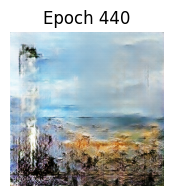

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1425 - c_loss: -17.1293 - c_wass_loss: -18.5542 - g_loss: -56.6199  
Epoch 441/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1372 - c_loss: -18.0891 - c_wass_loss: -19.4614 - g_loss: -42.8038  
Epoch 442/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0935 - c_loss: -16.0641 - c_wass_loss: -16.9993 - g_loss: -9.2427  
Epoch 443/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1262 - c_loss: -15.2837 - c_wass_loss: -16.5457 - g_loss: -58.0714  
Epoch 444/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1336 - c_loss: -17.5556 - c_wass_loss: -18.8913 - g_loss: -74.0395  
Epoch 445/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0881 - c_loss: -15.9283 - c_wass_loss: -16.8089 - g_loss: -21.4037  
Epoch 446/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1462 - c_loss: -19.2305 - c_wass_loss: -20.6927 - g_loss: -19.5170  
Epoch 447/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0959 - c_loss: -15.8776 - c_

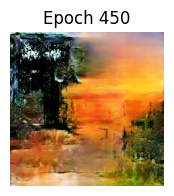

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1341 - c_loss: -17.5674 - c_wass_loss: -18.9079 - g_loss: -51.7009  
Epoch 451/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1032 - c_loss: -15.0364 - c_wass_loss: -16.0681 - g_loss: -22.7459  
Epoch 452/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0889 - c_loss: -15.6669 - c_wass_loss: -16.5563 - g_loss: -53.2577  
Epoch 453/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0916 - c_loss: -16.1340 - c_wass_loss: -17.0499 - g_loss: -22.8895  
Epoch 454/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1223 - c_loss: -18.4407 - c_wass_loss: -19.6642 - g_loss: -37.8141  
Epoch 455/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1286 - c_loss: -15.5183 - c_wass_loss: -16.8046 - g_loss: -44.9054  
Epoch 456/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1288 - c_loss: -18.4060 - c_wass_loss: -19.6938 - g_loss: -45.1075  
Epoch 457/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1482 - c_loss: -16.2759 - c

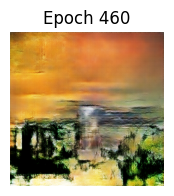

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0788 - c_loss: -16.8096 - c_wass_loss: -17.5978 - g_loss: -47.0260  
Epoch 461/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1252 - c_loss: -16.7960 - c_wass_loss: -18.0484 - g_loss: -24.6252  
Epoch 462/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0929 - c_loss: -15.3366 - c_wass_loss: -16.2656 - g_loss: -36.1744  
Epoch 463/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1014 - c_loss: -16.4763 - c_wass_loss: -17.4906 - g_loss: -52.8515  
Epoch 464/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1252 - c_loss: -17.3615 - c_wass_loss: -18.6131 - g_loss: -39.7545  
Epoch 465/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1084 - c_loss: -17.8433 - c_wass_loss: -18.9269 - g_loss: -48.2783  
Epoch 466/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1146 - c_loss: -16.1512 - c_wass_loss: -17.2974 - g_loss: -75.0503  
Epoch 467/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1317 - c_loss: -16.8895 - c

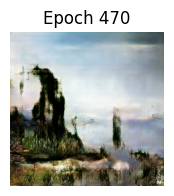

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1620 - c_loss: -18.2978 - c_wass_loss: -19.9180 - g_loss: -18.5806  
Epoch 471/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0946 - c_loss: -13.6062 - c_wass_loss: -14.5518 - g_loss: -10.6538 
Epoch 472/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1051 - c_loss: -16.5267 - c_wass_loss: -17.5780 - g_loss: -53.9189  
Epoch 473/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - c_gp: 0.0457 - c_loss: -10.3709 - c_wass_loss: -10.8283 - g_loss: -8.2679  
Epoch 474/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0960 - c_loss: -15.5128 - c_wass_loss: -16.4733 - g_loss: -47.8908  
Epoch 475/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1113 - c_loss: -17.5230 - c_wass_loss: -18.6363 - g_loss: -4.9651  
Epoch 476/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1155 - c_loss: -16.7214 - c_wass_loss: -17.8768 - g_loss: -31.3112  
Epoch 477/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1284 - c_loss: -15.2807 - c_wa

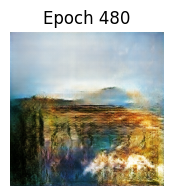

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0919 - c_loss: -17.0078 - c_wass_loss: -17.9263 - g_loss: -66.6007  
Epoch 481/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1127 - c_loss: -15.7726 - c_wass_loss: -16.8994 - g_loss: -59.3129  
Epoch 482/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1345 - c_loss: -17.7537 - c_wass_loss: -19.0987 - g_loss: -25.8375  
Epoch 483/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1091 - c_loss: -15.2755 - c_wass_loss: -16.3666 - g_loss: -35.2307  
Epoch 484/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1150 - c_loss: -14.7009 - c_wass_loss: -15.8510 - g_loss: -54.3474  
Epoch 485/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1391 - c_loss: -17.1966 - c_wass_loss: -18.5874 - g_loss: -69.3080  
Epoch 486/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1164 - c_loss: -13.2320 - c_wass_loss: -14.3958 - g_loss: -2.0869  
Epoch 487/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - c_gp: 0.1063 - c_loss: -16.0450 - c_

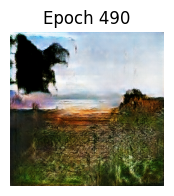

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1504 - c_loss: -17.6420 - c_wass_loss: -19.1464 - g_loss: -71.6723  
Epoch 491/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1157 - c_loss: -14.4000 - c_wass_loss: -15.5573 - g_loss: 4.6914  
Epoch 492/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1319 - c_loss: -18.0327 - c_wass_loss: -19.3517 - g_loss: -66.4343  
Epoch 493/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0829 - c_loss: -13.3721 - c_wass_loss: -14.2011 - g_loss: -15.8258  
Epoch 494/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0653 - c_loss: -14.3538 - c_wass_loss: -15.0070 - g_loss: -38.1620  
Epoch 495/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1217 - c_loss: -15.7169 - c_wass_loss: -16.9334 - g_loss: -55.2157  
Epoch 496/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.0999 - c_loss: -15.7937 - c_wass_loss: -16.7932 - g_loss: -26.5825  
Epoch 497/500
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1174 - c_loss: -17.3653 - c_w

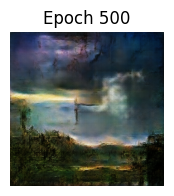

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - c_gp: 0.1152 - c_loss: -15.9303 - c_wass_loss: -17.0822 - g_loss: -53.3111  


In [15]:
EPOCHS = 500

wgangp.fit(
    train,
    epochs=EPOCHS,
    steps_per_epoch=10,
    callbacks=[
        model_checkpoint_callback,
        tensorboard_callback,
        ImageGenerator(latent_dim=Z_DIM),
    ],
)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 791ms/step


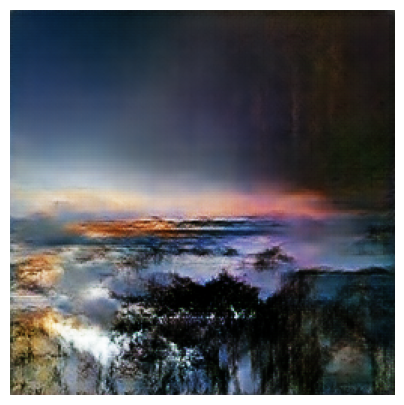

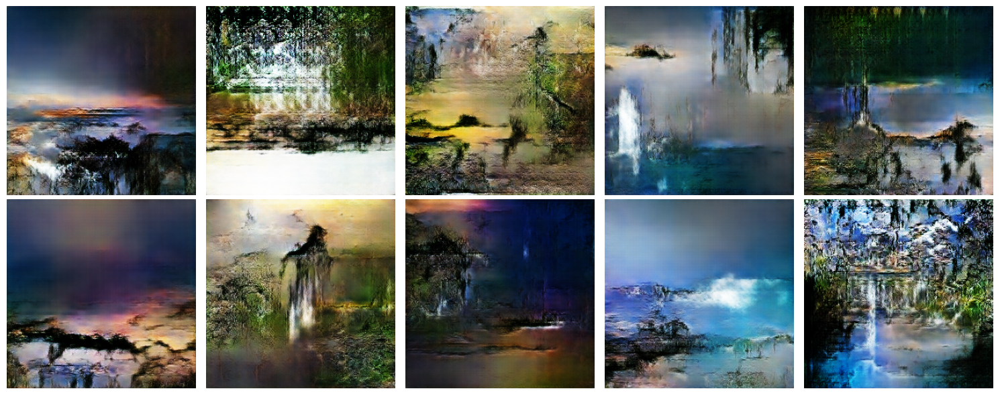

In [16]:
z_sample = np.random.normal(size=(10, Z_DIM))
imgs = wgangp.generator.predict(z_sample)

# Normalize images to [0, 1] range 
imgs = (imgs + 1) / 2.0

# Display single image
plt.figure(figsize=(5, 5))
plt.imshow(imgs[0])
plt.axis('off')
plt.show()

# Display all 10 images in a grid
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for i, ax in enumerate(axes.flat):
    ax.imshow(imgs[i])
    ax.axis('off')
plt.tight_layout()
plt.show()

### Generate Images for Submission

In [17]:
import os, shutil, zipfile
import numpy as np
from PIL import Image

NUM_IMAGES   = 7000          
BATCH_SIZE   = 64            
Z_DIM        = wgangp.latent_dim  
OUTPUT_DIR   = "generated_images"
ZIP_NAME     = "images.zip"

# fresh output folder
if os.path.exists(OUTPUT_DIR):
    shutil.rmtree(OUTPUT_DIR)
os.makedirs(OUTPUT_DIR, exist_ok=True)

def save_batch(batch, start_idx: int):
    """Save a batch of model outputs as PNGs."""
    # rescale from [-1, 1] to [0, 255]
    batch = (batch * 127.5 + 127.5).astype(np.uint8)

    for i, img_arr in enumerate(batch):
        idx = start_idx + i
        img = Image.fromarray(img_arr, mode="RGB")
        img.save(os.path.join(OUTPUT_DIR, f"{idx:05d}.png"), optimize=True)

# generate in batches
for start in range(0, NUM_IMAGES, BATCH_SIZE):
    cur_batch = min(BATCH_SIZE, NUM_IMAGES - start)
    z = np.random.normal(0, 1, (cur_batch, Z_DIM)).astype(np.float32)
    preds = wgangp.generator.predict(z, verbose=0)
    save_batch(preds, start)

# zip the folder
if os.path.exists(ZIP_NAME):
    os.remove(ZIP_NAME)
shutil.make_archive(OUTPUT_DIR, "zip", OUTPUT_DIR)
print(f"✅ {NUM_IMAGES} images saved to '{OUTPUT_DIR}' and zipped to '{ZIP_NAME}'.")


✅ 7000 images saved to 'generated_images' and zipped to 'images.zip'.


In [21]:
os.rename('generated_images.zip', 'images.zip')
os.listdir('/kaggle/working/')

['images.zip', '.virtual_documents', 'checkpoint', 'generated_images', 'logs']

## Conclusion

This project implemented a Wasserstein GAN with Gradient Penalty (WGAN-GP) to generate photo-realistic images, targeting a MiFID score below 1000. The WGAN-GP architecture, featuring a deep convolutional generator and critic, provided a stable training process and effectively mitigated common GAN issues such as mode collapse and training instability. The use of gradient penalty, rather than weight clipping, enforced the 1-Lipschitz constraint on the critic, resulting in more reliable convergence and meaningful learning curves.

Extensive hyperparameter tuning and a large number of training epochs (500) were required to achieve visually convincing results. The generator successfully produced images that closely resembled the training data, though some fine details and overall image quality still lagged behind the originals. The best model achieved a MiFID score of 92, well below the competition threshold.

Key takeaways include the importance of careful balancing between generator and critic updates, the computational demands of gradient penalty, and the benefits of architectural choices such as batch normalization and leaky ReLU activations. Future improvements could involve further hyperparameter optimization, progressive growing for higher-resolution outputs, and exploring conditional generation to control specific image attributes.

Overall, WGAN-GP proved to be a robust framework for high-quality image synthesis, demonstrating both the challenges and the potential of modern generative modeling techniques.

